In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scrublet as scr
import seaborn as sns
import scipy.stats
import anndata
import os

import scipy as scipy
import scipy as sp
import pickle as pkl
import matplotlib.pyplot as plt
import re
from collections import defaultdict
from statsmodels.nonparametric.smoothers_lowess import lowess
from numpy import asarray as ar
from collections import Counter
import networkx as nx
import igraph
import glob
import scirpy as ir
import sys

import bbknn

os.getcwd()

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)

sc.settings.set_figure_params(dpi=100, color_map='Blues')
sc.logging.print_version_and_date()
%load_ext autoreload
%autoreload 2

Matplotlib created a temporary config/cache directory at /tmp/matplotlib-ozy00zhl because the default path (/home/ubuntu/.config/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


Running Scanpy 1.6.0, on 2022-03-07 12:22.


In [2]:
def intersection(lst1, lst2): 
    lst3 = [value for value in lst1 if value in lst2] 
    return lst3 

def subtraction(lst1, lst2): 
    lst3 = [value for value in lst1 if not value in lst2] 
    return lst3

### Importing data

In [3]:
adata = sc.read('/mnt/Science_revision/write/TICA_merged_singlets_immune.h5ad')

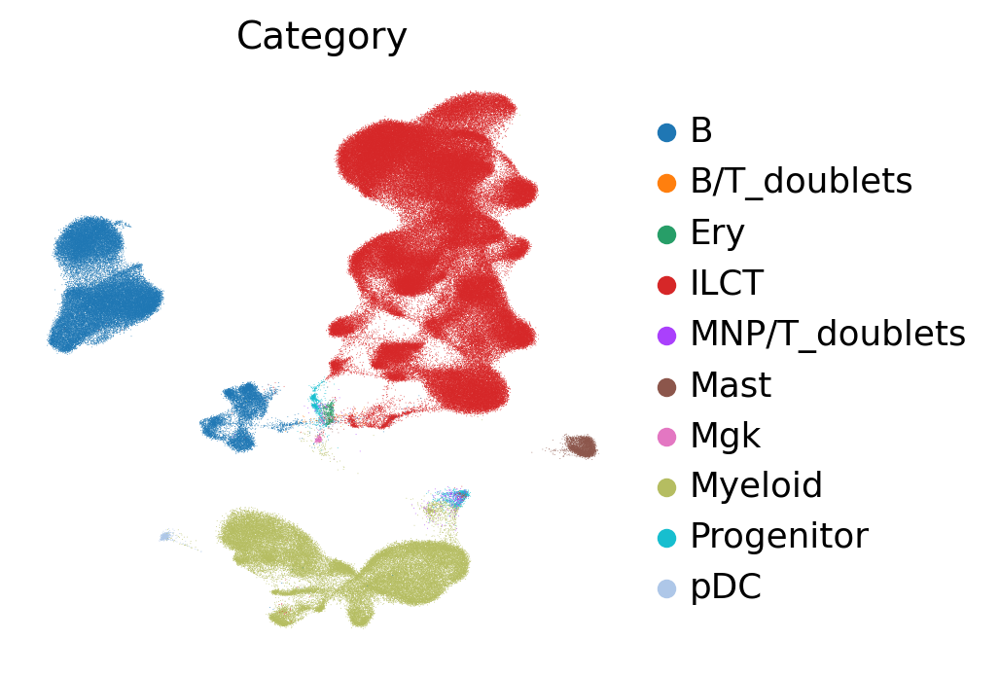

In [4]:
sc.pl.umap(adata, color='Category', frameon=False)

#### Subsetting T cells and ILCs

In [5]:
adata = sc.read('/mnt/Science_revision/write/20211111_PIP_CZI_UKNY_over40_processed_immune.h5ad')

In [6]:
imgt_vdj = pd.read_csv('/mnt/Science_revision/imgt_pip_vdj.csv')

In [7]:
imgt_vdj = list(imgt_vdj['0'])

In [8]:
adata.X.min()

-2.3022542983229757

In [9]:
adata.raw.X.min()

0.0

In [10]:
adata = adata.raw.to_adata()

In [11]:
adata.X.min()

0.0

In [12]:
TILC = ['ILCT']

In [13]:
adata=adata[adata.obs['Category'].isin(TILC),:]

In [14]:
adata.raw = adata
sc.pp.highly_variable_genes(adata, subset=True)
hvg = list(adata.var[adata.var['highly_variable']==True].index)

extracting highly variable genes
    finished (0:00:14)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [15]:
nohvg = intersection(hvg,imgt_vdj )
adata.var.loc[nohvg,  'highly_variable'] = False
sc.pp.regress_out(adata, ['fraction_mito'])
sc.pp.scale(adata, max_value=10)

regressing out ['fraction_mito']
    sparse input is densified and may lead to high memory use
    finished (0:03:21)


In [16]:
bbknn.ridge_regression(adata, batch_key=['chem'], confounder_key=['new_predicted_labels'])

computing ridge regression
	finished: `.X` now features regression residuals
	`.layers['X_explained']` stores the expression explained by the technical effect (0:00:07)


In [17]:
sc.pp.pca(adata)
bbknn.bbknn(adata, batch_key='donor_id')
sc.tl.umap(adata)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:31)
computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:01:23)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:06:19)


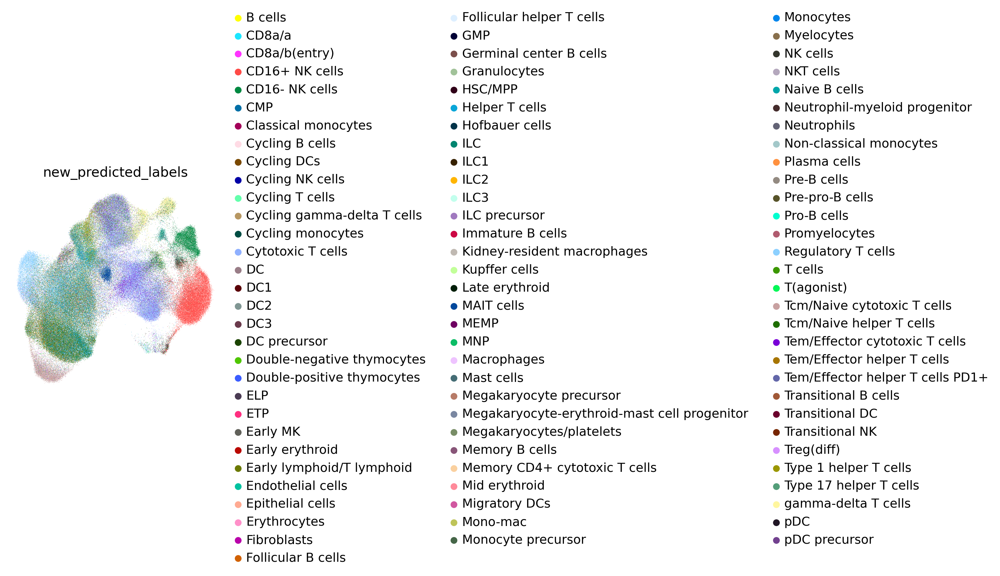

In [18]:
sc.pl.umap(adata, color=['new_predicted_labels'],frameon=False)

In [ ]:
sc.tl.leiden(adata)

running Leiden clustering


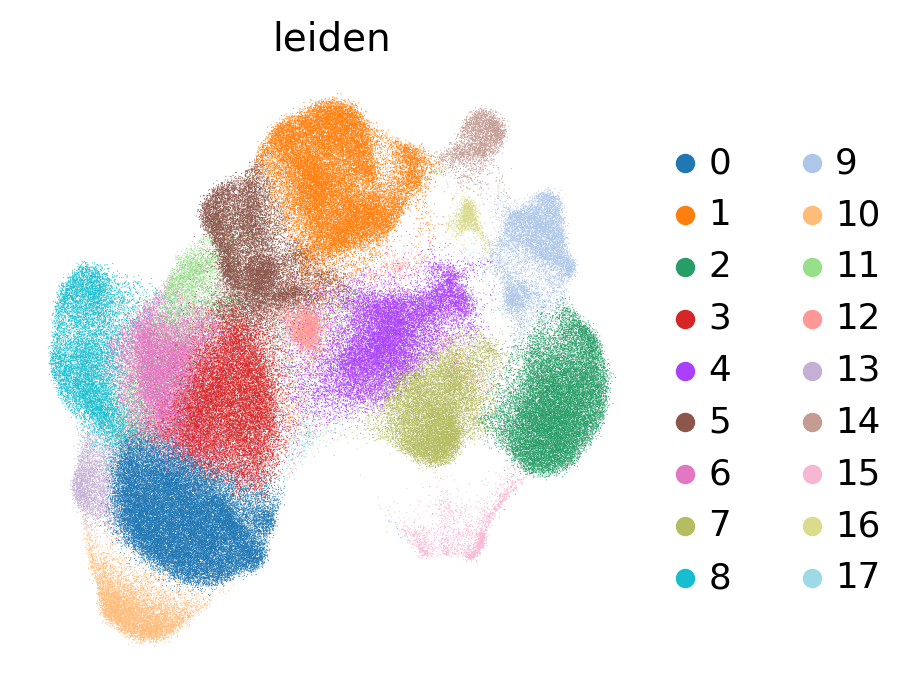

In [4]:
sc.pl.umap(adata, color='leiden', frameon=False)

In [ ]:
adata.write('/mnt/Science_revision/write/TICA_TILC.h5ad')

In [3]:
adata = sc.read('/mnt/Science_revision/write/TICA_TILC.h5ad')

In [ ]:
votes = pd.crosstab(adata.obs['new_predicted_labels'], adata.obs['leiden'])
majority = votes.idxmax()
adata.obs['new_predicted_labels_maj'] = majority[adata.obs['leiden'].values].values

In [ ]:
sc.pl.umap(adata, color='new_predicted_labels_maj', frameon=False)

In [ ]:
list(adata.obs['new_predicted_labels_maj'].unique())

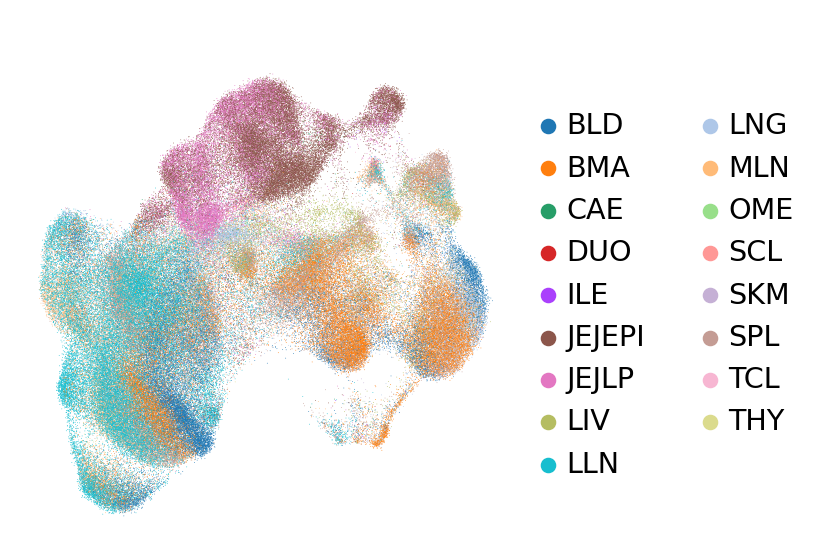

In [10]:
sc.set_figure_params(dpi_save=600)
sc.pl.umap(adata, color='organ_code', frameon=False, title=' ', save='4C.pdf')

# Marker genes

In [ ]:
sc.tl.rank_genes_groups(adata, groupby='leiden',method='wilcoxon',pts=True)

In [ ]:
pts = adata.uns['rank_genes_groups']['pts']
pts_rest = adata.uns['rank_genes_groups']['pts_rest']

result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names

res = pd.DataFrame(index=range(0, pts.shape[0]))
for group in groups:
    df = pd.DataFrame({group + '_' + key: result[key][group] for key in ['names', 'pvals', 'pvals_adj', 'logfoldchanges']})
    df[group+'_pts'] = pts.loc[df[group + '_names'], group].values
    df[group+'_pts_rest'] = pts_rest.loc[df[group + '_names'], group].values
    res = res.join(df)


In [ ]:
output = pd.DataFrame()
for group in groups:
       sub_res = res[[f"{group}_{key}" for key in ['names', 'pvals', 'pvals_adj', 'logfoldchanges', 'pts','pts_rest']]]
       sub_res.columns = ['names', 'pvals', 'pvals_adj', 'logfoldchanges', 'pts','pts_rest']
       sub_res['celltype'] = group
       flag = (sub_res['pvals'] < 0.05) & (sub_res['pts'] > 0.5) & (sub_res['pts_rest'] < 0.3)
       sub_res = sub_res[flag]
       output = output.append(sub_res)
output.to_csv('TILC_markers.csv', header=True, index=False)

In [ ]:
output = pd.DataFrame()
for group in groups:
       sub_res = res[[f"{group}_{key}" for key in ['names', 'pvals', 'pvals_adj', 'logfoldchanges', 'pts','pts_rest']]]
       sub_res.columns = ['names', 'pvals', 'pvals_adj', 'logfoldchanges', 'pts','pts_rest']
       sub_res['celltype'] = group
       flag = (sub_res['pvals'] < 0.05) & (sub_res['pts'] > 0.15) & (sub_res['pts_rest'] < 0.08)
       sub_res = sub_res[flag]
       output = output.append(sub_res)
output.to_csv('TILC_low_exp_markers.csv', header=True, index=False)

In [ ]:
output.head(10)

In [5]:
tilc_annot = {'5':'Trm_Th1/Th17',
 '1':'Trm_gut_CD8',
 '14':'Trm_Tgd',
 '4':'Trm/em_CD8',
 '16':'ILC3',
 '12':'MAIT',
 '8':'Tregs',
 '3':'Teffector/EM_CD4',
 '15':'Cycling T&NK',
              '0':'Tnaive/CM_CD4',
 '6':'Tfh',
 '7':'Tem/emra_CD8',
 '17':'Tem/emra_CD8',
 '2':'NK_CD16+',
 '9':'NK_CD56bright_CD16-',
 '10':'Tnaive/CM_CD8',
 '13':'Tnaive/CM_CD4_activated',
 '0':'Tnaive/CM_CD4',
 '11':'Teffector/EM_CD4'}

In [6]:
adata.obs['manual_annot'] = adata.obs['leiden'].map(tilc_annot)

In [7]:
list(adata.obs['manual_annot'].unique())

['Trm_Th1/Th17',
 'Trm_gut_CD8',
 'Trm_Tgd',
 'Teffector/EM_CD4',
 'Trm/em_CD8',
 'Cycling T&NK',
 'Tregs',
 'Tem/emra_CD8',
 'Tfh',
 'ILC3',
 'Tnaive/CM_CD4',
 'NK_CD16+',
 'Tnaive/CM_CD8',
 'MAIT',
 'NK_CD56bright_CD16-',
 'Tnaive/CM_CD4_activated']

In [8]:
ct_order = ['Tnaive/CM_CD4', 'Tnaive/CM_CD4_activated','Tregs',
 'Teffector/EM_CD4',
 
 'Tfh',     'Trm_Th1/Th17',
            'MAIT',
  'Tnaive/CM_CD8',          
 'Trm_gut_CD8',
 'Trm_Tgd',
  'Trm/em_CD8','Tem/emra_CD8',
 'Cycling T&NK',
 
 
 
 'NK_CD16+',
 'NK_CD56bright_CD16-', 'ILC3']

... storing 'manual_annot' as categorical


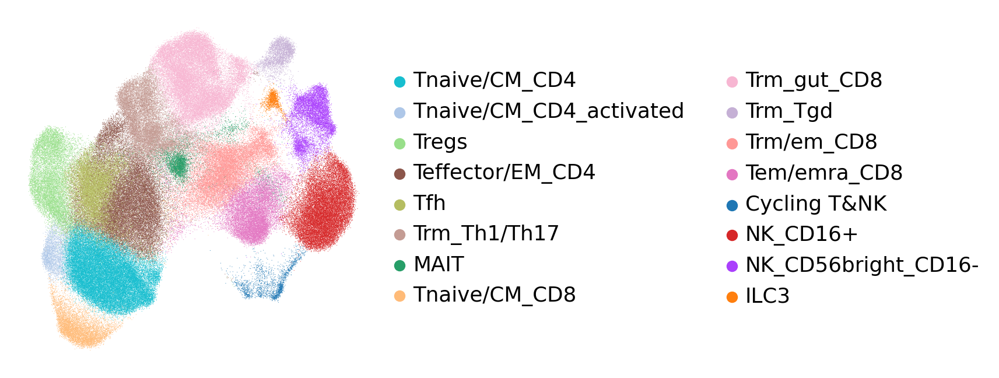

In [9]:
sc.pl.umap(adata, color='manual_annot', frameon=False, groups=ct_order, title='')

In [11]:
adata.write('/mnt/Science_revision/write/TICA_TILC.h5ad')

#### Subset Tgd_CRTAM+ cells

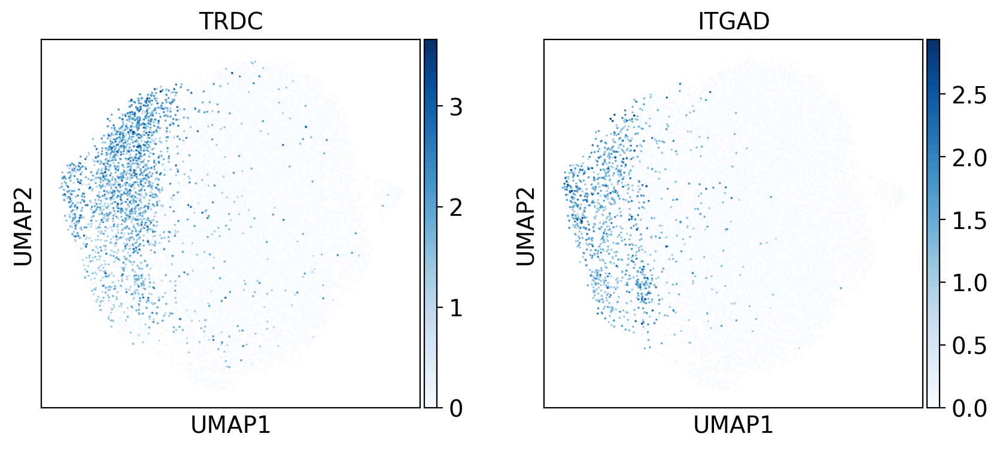

In [18]:
sc.pl.umap(adata, color=['TRDC','ITGAD'])

In [12]:
adata = adata.raw.to_adata()

In [13]:
adata.X.min()

0.0

In [14]:
adata=adata[adata.obs['manual_annot'].isin(['Trm/em_CD8']),:]

In [15]:
adata.raw = adata
sc.pp.highly_variable_genes(adata, subset=True)
sc.pp.scale(adata, max_value=10)

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [16]:
bbknn.ridge_regression(adata, batch_key=['chem'], confounder_key=['new_predicted_labels'])

computing ridge regression
	finished: `.X` now features regression residuals
	`.layers['X_explained']` stores the expression explained by the technical effect (0:00:00)


In [17]:
sc.pp.pca(adata)
bbknn.bbknn(adata, batch_key='donor_id')
sc.tl.umap(adata)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:03)
computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:00:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:26)


In [19]:
sc.tl.leiden(adata)

running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:09)


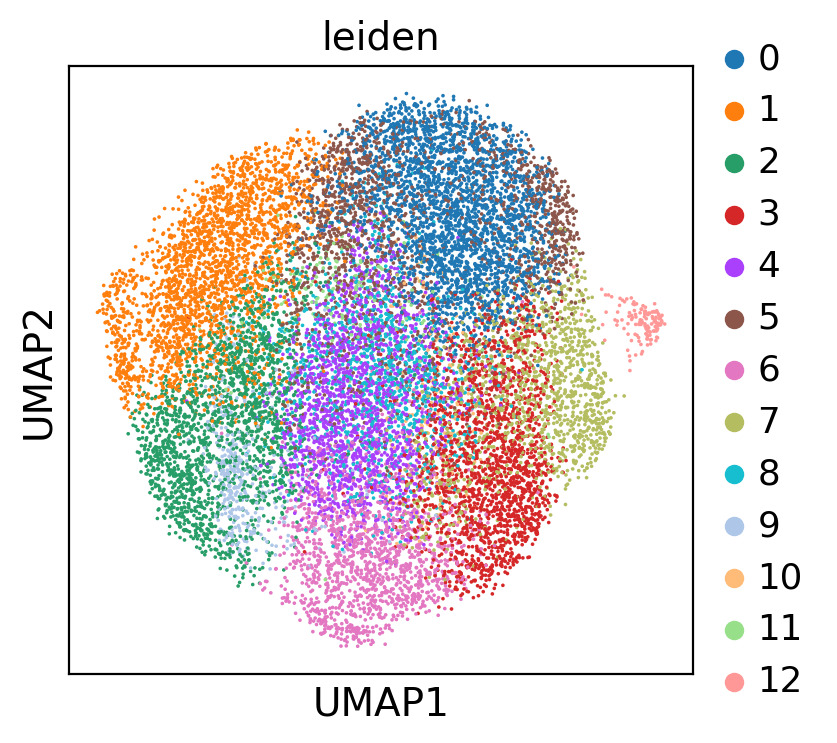

In [20]:
sc.pl.umap(adata, color=['leiden'])

In [21]:
tdata = sc.read('/mnt/Science_revision/write/TICA_TILC.h5ad')

In [22]:
tdata.obs['CRTAM_leiden'] = adata.obs['leiden']

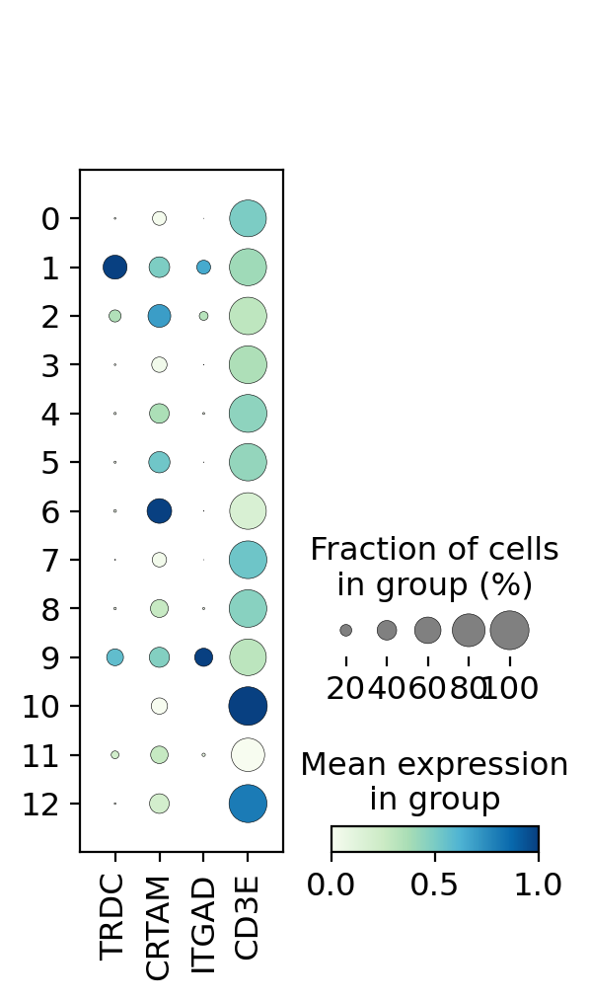

In [24]:
sc.pl.dotplot(tdata, var_names=['TRDC','CRTAM','ITGAD','CD3E'], groupby='CRTAM_leiden', standard_scale='var', cmap='GnBu')

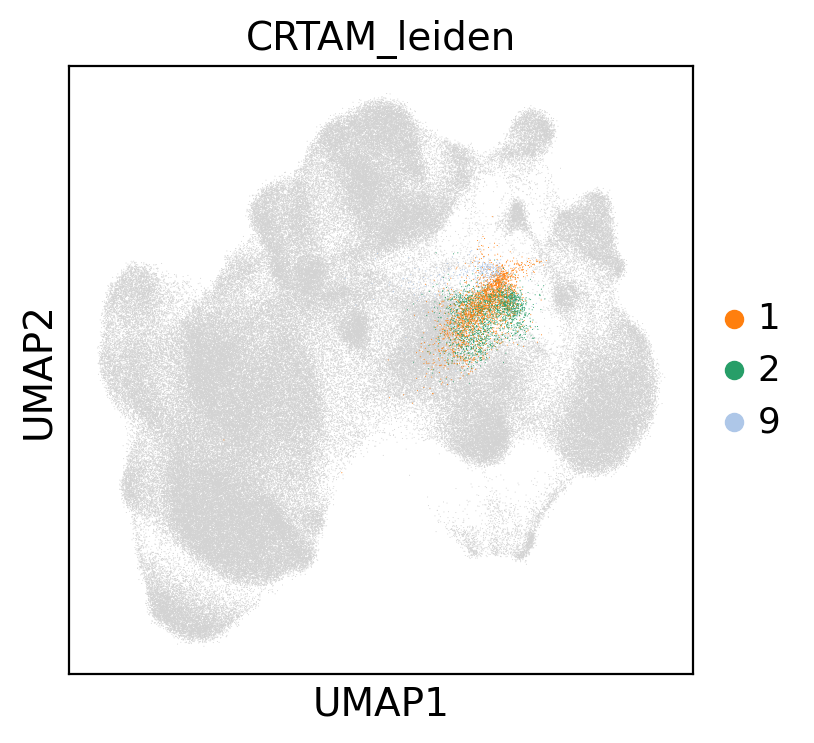

In [23]:
sc.pl.umap(tdata, color='CRTAM_leiden', groups=['1','2','9'])

In [26]:
tdata.obs['new_manual_annot'] = tdata.obs['manual_annot'].astype(str)

In [27]:
flag = tdata.obs.CRTAM_leiden.isin(['1', '2', '9'])

In [28]:
tdata.obs.loc[flag, 'new_manual_annot'] = tdata.obs.loc[flag, 'CRTAM_leiden'].values

... storing 'new_manual_annot' as categorical


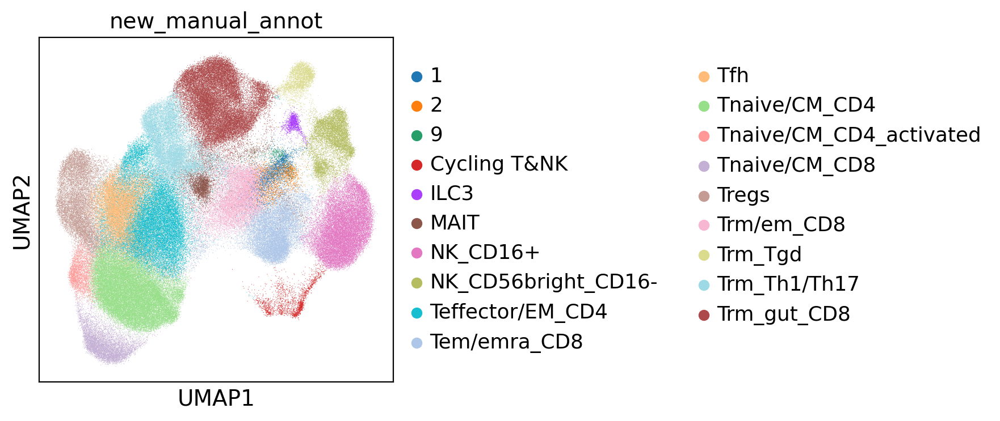

In [29]:
sc.pl.umap(tdata, color='new_manual_annot')

In [30]:
keys = list(tdata.obs['new_manual_annot'].unique())

In [31]:
keys

['Trm_Th1/Th17',
 'Trm_gut_CD8',
 'Trm_Tgd',
 'Teffector/EM_CD4',
 'Trm/em_CD8',
 'Cycling T&NK',
 'Tregs',
 'Tem/emra_CD8',
 'Tfh',
 'ILC3',
 'Tnaive/CM_CD4',
 '9',
 'NK_CD16+',
 'Tnaive/CM_CD8',
 'MAIT',
 '1',
 'NK_CD56bright_CD16-',
 '2',
 'Tnaive/CM_CD4_activated']

In [32]:
values = ['Trm_Th1/Th17',
 'Trm_gut_CD8',
 'Trm_Tgd',
 'Teffector/EM_CD4',
 'Trm/em_CD8',
 'Cycling T&NK',
 'Tregs',
 'Tem/emra_CD8',
 'Tfh',
 'ILC3',
 'Tnaive/CM_CD4',
 'Tgd_CRTAM+',
 'NK_CD16+',
 'Tnaive/CM_CD8',
 'MAIT',
  'Tgd_CRTAM+',
 'NK_CD56bright_CD16-',
  'Tgd_CRTAM+',
 'Tnaive/CM_CD4_activated']

In [33]:
gd_dict = {keys[i]: values[i] for i in range(len(keys))}

In [34]:
tdata.obs['manual_annot_v2'] = tdata.obs['new_manual_annot'].map(gd_dict)

... storing 'manual_annot_v2' as categorical


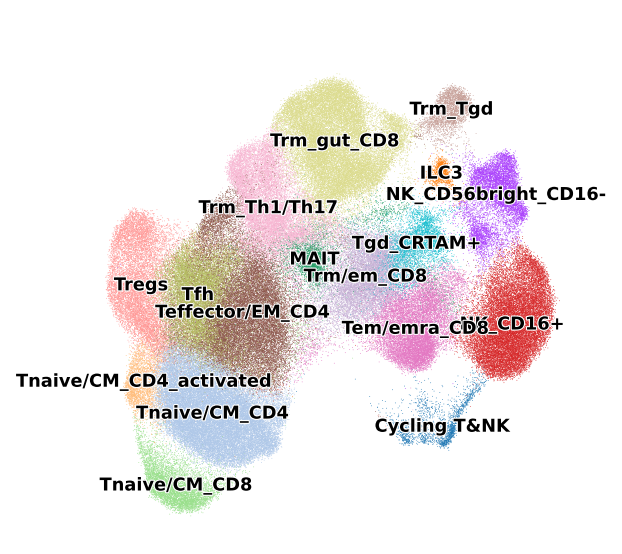

In [35]:
sc.set_figure_params(dpi_save=600)
sc.pl.umap(tdata, color='manual_annot_v2', frameon=False, title=' ', legend_loc='on data', legend_fontoutline=1, legend_fontsize=8)

In [36]:
tdata.write('/mnt/Science_revision/write/TICA_TILC.h5ad')

#### Cluster mixed CD4/CD8

In [37]:
adata = sc.read('/mnt/Science_revision/write/TICA_TILC.h5ad')

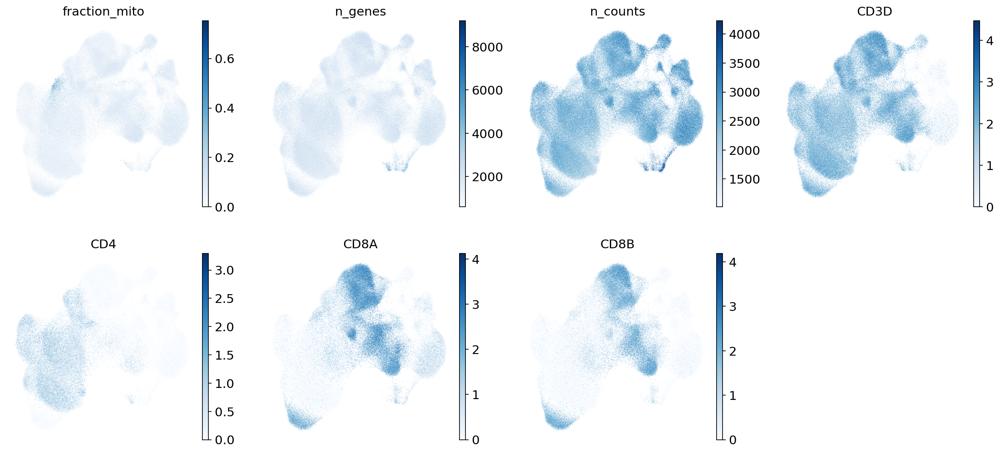

In [38]:
sc.pl.umap(adata, color=['fraction_mito','n_genes','n_counts','CD3D','CD4','CD8A','CD8B'], frameon=False)

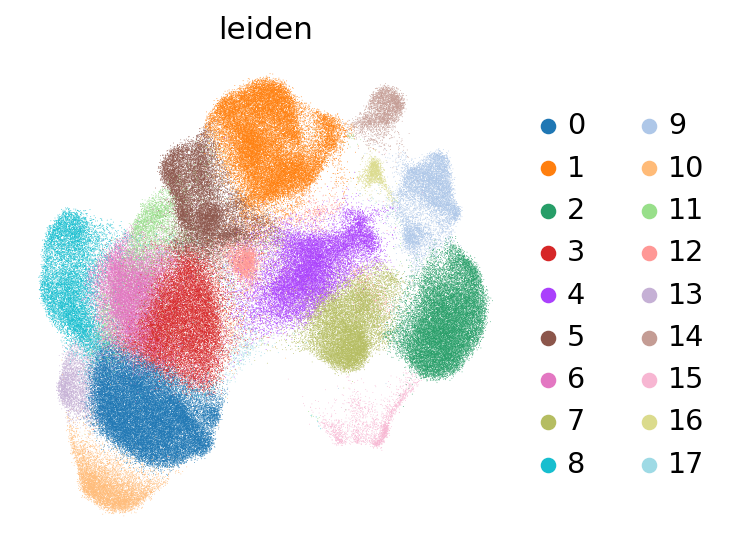

In [39]:
sc.pl.umap(tdata, color='leiden', frameon=False)

In [40]:
test = adata[adata.obs['leiden']=='11']

In [41]:
test.obs['new_predicted_labels'].value_counts().head(10)

Tcm/Naive helper T cells          865
Helper T cells                    791
NK cells                          570
T cells                           380
Memory B cells                    375
Tem/Effector cytotoxic T cells    300
Cytotoxic T cells                 298
Tem/Effector helper T cells       240
ILC3                              202
Plasma cells                      179
Name: new_predicted_labels, dtype: int64

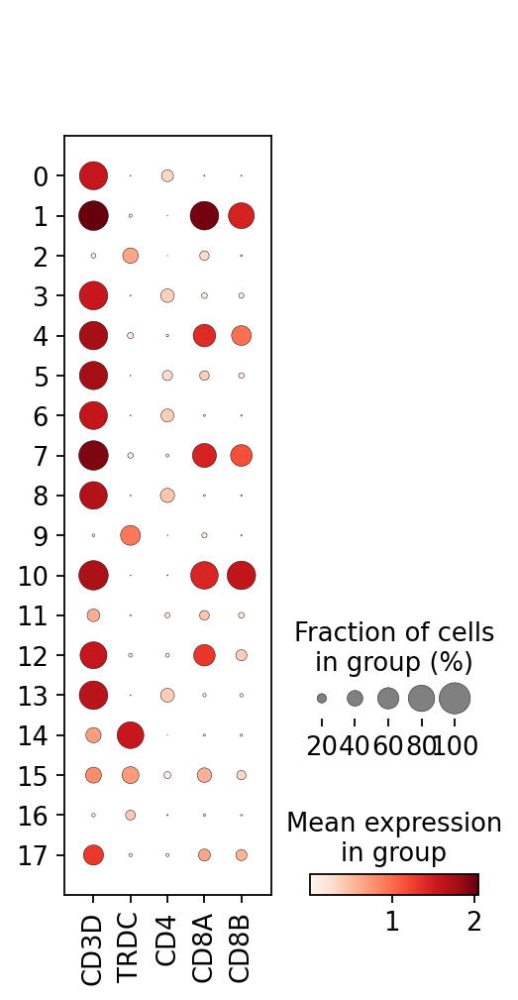

In [42]:
sc.pl.dotplot(tdata, var_names=['CD3D','TRDC','CD4','CD8A','CD8B'], groupby='leiden')

#### Relabel cluster 11

In [43]:
tilc_annot = {'5':'Trm_Th1/Th17',
 '1':'Trm_gut_CD8',
 '14':'Trm_Tgd',
 '4':'Trm/em_CD8',
 '16':'ILC3',
 '12':'MAIT',
 '8':'Tregs',
 '3':'Teffector/EM_CD4',
 '15':'Cycling T&NK',
              '0':'Tnaive/CM_CD4',
 '6':'Tfh',
 '7':'Tem/emra_CD8',
 '17':'Tem/emra_CD8',
 '2':'NK_CD16+',
 '9':'NK_CD56bright_CD16-',
 '10':'Tnaive/CM_CD8',
 '13':'Tnaive/CM_CD4_activated',
 '0':'Tnaive/CM_CD4',
 '11':'T_CD4/CD8'}

In [44]:
tdata.obs['manual_annot_v3'] = tdata.obs['leiden'].map(tilc_annot)

In [45]:
list(tdata.obs['manual_annot_v3'].unique())

['Trm_Th1/Th17',
 'Trm_gut_CD8',
 'Trm_Tgd',
 'T_CD4/CD8',
 'Trm/em_CD8',
 'Cycling T&NK',
 'Tregs',
 'Teffector/EM_CD4',
 'Tem/emra_CD8',
 'Tfh',
 'ILC3',
 'Tnaive/CM_CD4',
 'NK_CD16+',
 'Tnaive/CM_CD8',
 'MAIT',
 'NK_CD56bright_CD16-',
 'Tnaive/CM_CD4_activated']

In [46]:
ct_order = ['Tnaive/CM_CD4', 'Tnaive/CM_CD4_activated','Tregs',
 'Teffector/EM_CD4',
 
 'Tfh',     'Trm_Th1/Th17',
            'MAIT',
  'Tnaive/CM_CD8',          
 'Trm_gut_CD8',
 'Trm_Tgd',
  'Trm/em_CD8','Tem/emra_CD8','T_CD4/CD8',
 'Cycling T&NK',
 
 
 
 'NK_CD16+',
 'NK_CD56bright_CD16-', 'ILC3']

... storing 'manual_annot_v3' as categorical


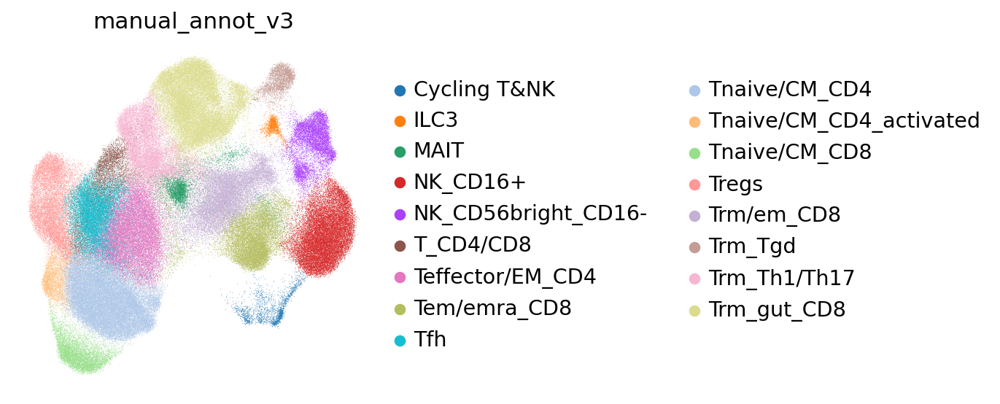

In [47]:
sc.pl.umap(tdata, color='manual_annot_v3', frameon=False)

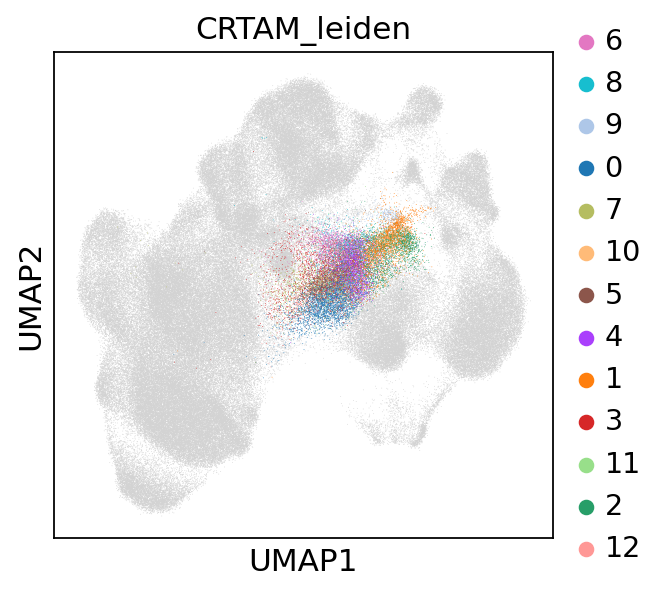

In [48]:
sc.pl.umap(tdata, color='CRTAM_leiden', groups=['6', '8', '9', '0', '7', '10', '5', '4', '1', '3', '11', '2', '12'])

In [49]:
tdata.obs['new_manual_annot'] = tdata.obs['manual_annot_v3'].astype(str)

In [50]:
flag = tdata.obs.CRTAM_leiden.isin(['1', '2', '9'])

In [51]:
tdata.obs.loc[flag, 'new_manual_annot'] = tdata.obs.loc[flag, 'CRTAM_leiden'].values

... storing 'new_manual_annot' as categorical


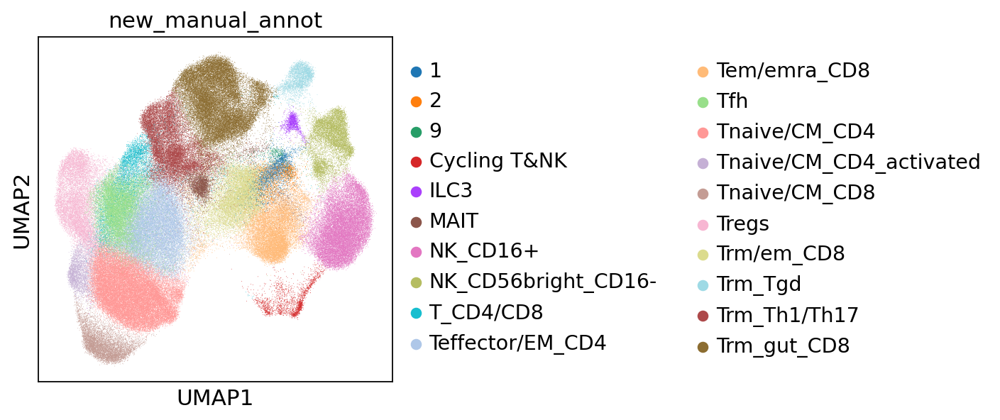

In [52]:
sc.pl.umap(tdata, color='new_manual_annot')

In [53]:
keys = list(tdata.obs['new_manual_annot'].unique())

In [54]:
keys

['Trm_Th1/Th17',
 'Trm_gut_CD8',
 'Trm_Tgd',
 'T_CD4/CD8',
 'Trm/em_CD8',
 'Cycling T&NK',
 'Tregs',
 'Teffector/EM_CD4',
 'Tem/emra_CD8',
 'Tfh',
 'ILC3',
 'Tnaive/CM_CD4',
 '9',
 'NK_CD16+',
 'Tnaive/CM_CD8',
 'MAIT',
 '1',
 'NK_CD56bright_CD16-',
 '2',
 'Tnaive/CM_CD4_activated']

In [55]:
values = ['Trm_Th1/Th17',
 'Trm_gut_CD8',
 'Trm_Tgd',
 'T_CD4/CD8',
 'Trm/em_CD8',
 'Cycling T&NK',
 'Tregs',
 'Teffector/EM_CD4',
 'Tem/emra_CD8',
 'Tfh',
 'ILC3',
 'Tnaive/CM_CD4',
 'Tgd_CRTAM+',
 'NK_CD16+',
 'Tnaive/CM_CD8',
 'MAIT',
 'Tgd_CRTAM+',
 'NK_CD56bright_CD16-',
 'Tgd_CRTAM+',
 'Tnaive/CM_CD4_activated']

In [56]:
gd_dict = {keys[i]: values[i] for i in range(len(keys))}

In [57]:
tdata.obs['manual_annot_v4'] = tdata.obs['new_manual_annot'].map(gd_dict)

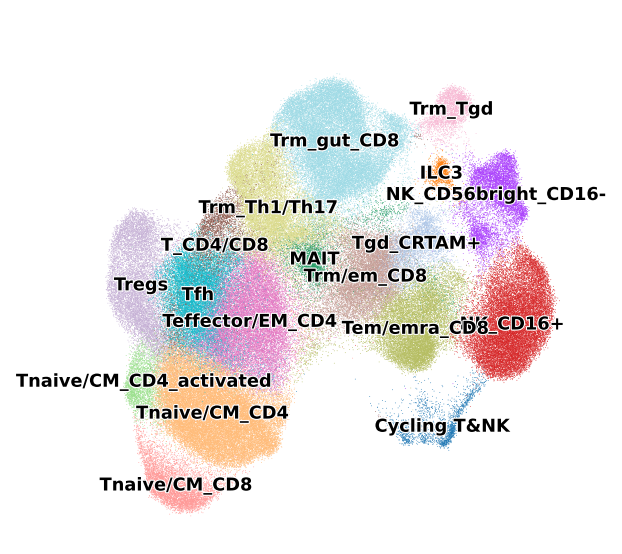

In [59]:
sc.set_figure_params(dpi_save=600)
sc.pl.umap(tdata, color='manual_annot_v4', frameon=False, title=' ', legend_loc='on data', legend_fontoutline=1, legend_fontsize=8)

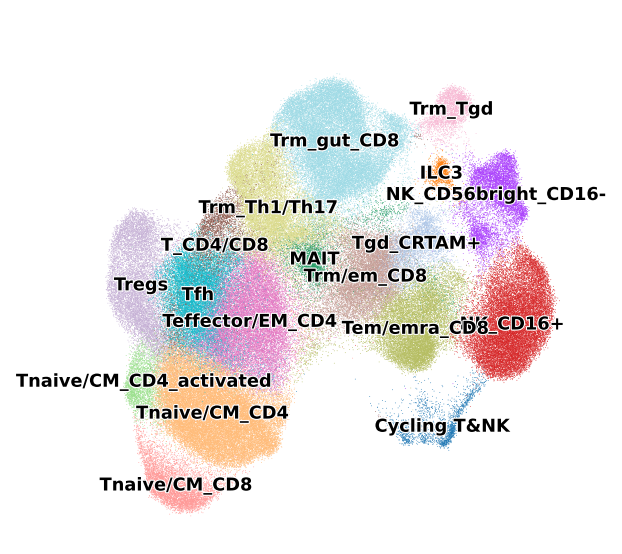

In [67]:
sc.set_figure_params(dpi_save=600)
sc.pl.umap(tdata, color='manual_annot_v4', frameon=False, title=' ', legend_loc='on data', legend_fontoutline=1, legend_fontsize=8)

In [68]:
tdata.write('/mnt/Science_revision/write/TICA_TILC.h5ad')

#### Subset Tgd_ITGAE+ cells from 5' donors

In [69]:
adata = sc.read('/mnt/Science_revision/write/TICA_TILC.h5ad')

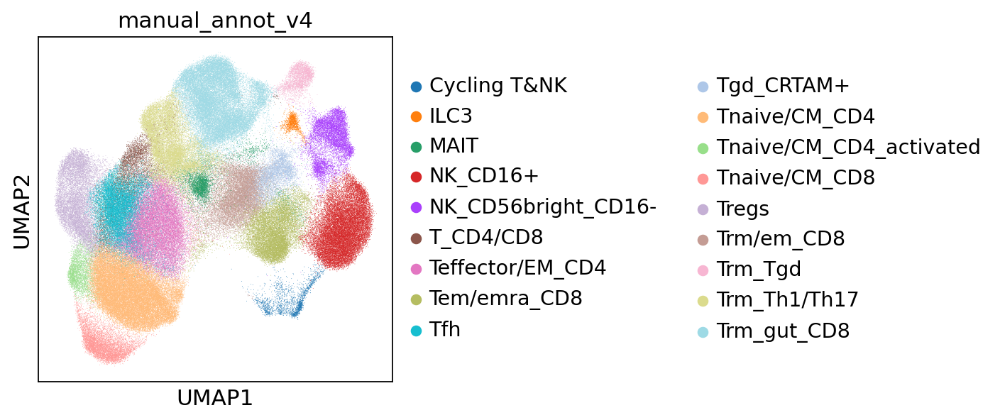

In [70]:
sc.pl.umap(adata, color='manual_annot_v4')

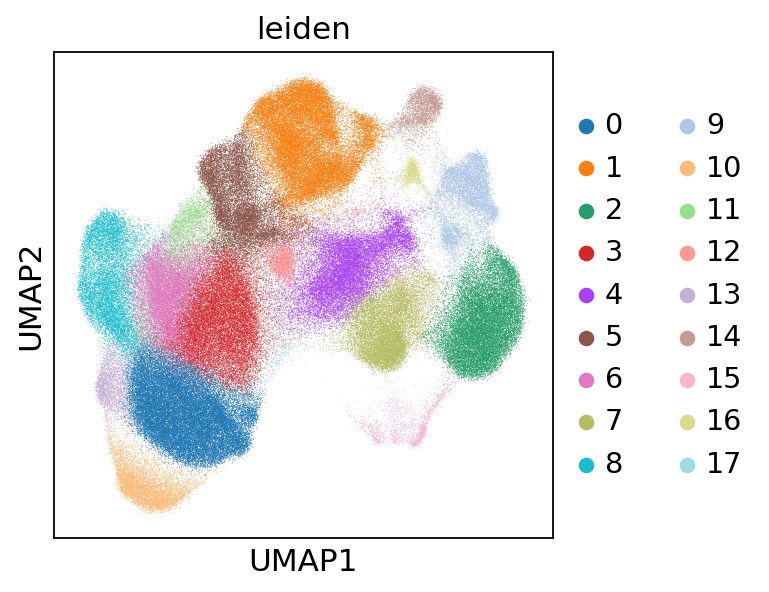

In [71]:
sc.pl.umap(adata, color='leiden')

In [72]:
adata = adata.raw.to_adata()

In [73]:
adata.X.min()

0.0

In [74]:
adata=adata[adata.obs['leiden'].isin(['1']),:]

In [75]:
adata.raw = adata
sc.pp.highly_variable_genes(adata, subset=True)
sc.pp.scale(adata, max_value=10)

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [76]:
bbknn.ridge_regression(adata, batch_key=['chem'], confounder_key=['new_predicted_labels'])

computing ridge regression
	finished: `.X` now features regression residuals
	`.layers['X_explained']` stores the expression explained by the technical effect (0:00:00)


In [77]:
sc.pp.pca(adata)
bbknn.bbknn(adata, batch_key='donor_id')
sc.tl.umap(adata)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:04)
computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:00:09)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:42)


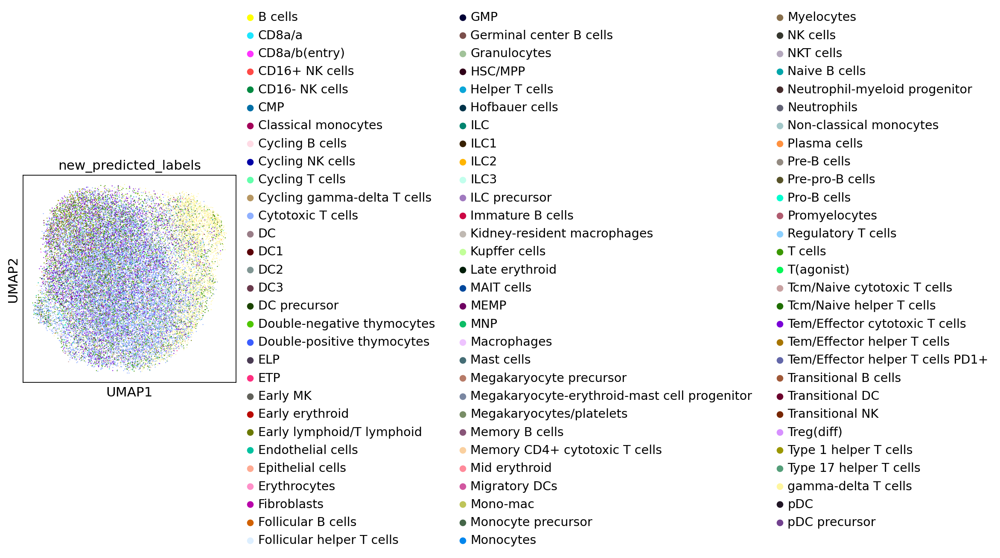

In [78]:
sc.pl.umap(adata, color=['new_predicted_labels'])

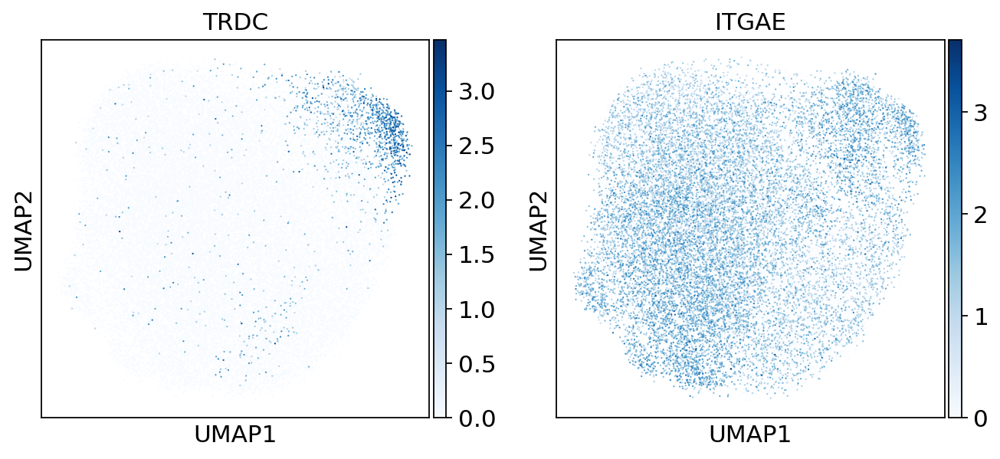

In [79]:
sc.pl.umap(adata, color=['TRDC','ITGAE'])

In [80]:
sc.tl.leiden(adata)

running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:16)


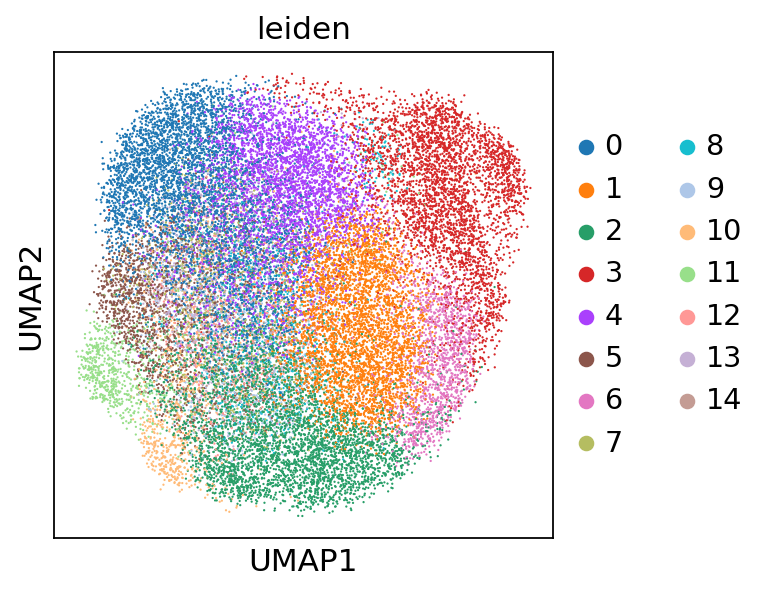

In [81]:
sc.pl.umap(adata, color=['leiden'])

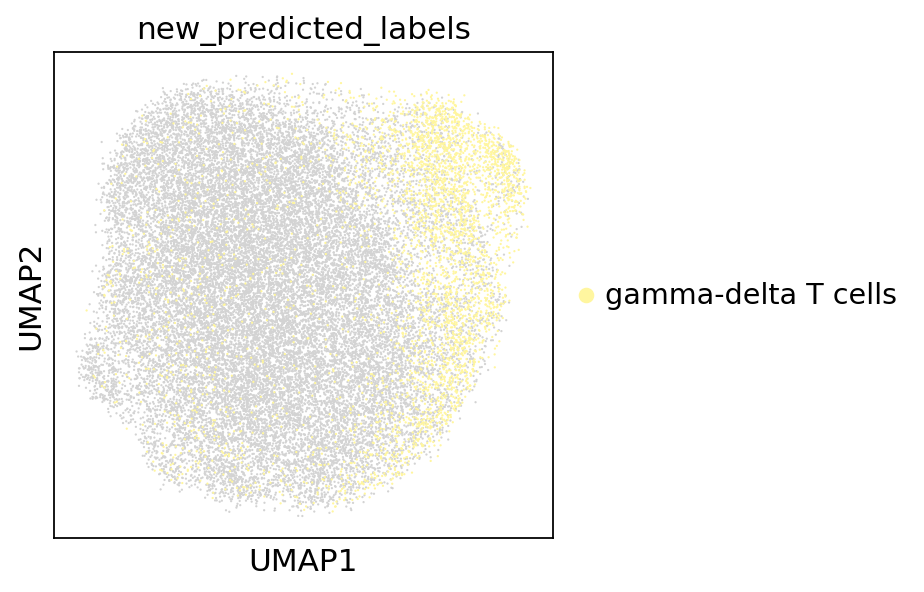

In [82]:
sc.pl.umap(adata, color=['new_predicted_labels'], groups=['gamma-delta T cells'])

In [83]:
tdata = sc.read('/mnt/Science_revision/write/TICA_TILC.h5ad')

In [84]:
tdata.obs['Trm_gut_CD8_leiden'] = adata.obs['leiden']

In [85]:
list(tdata.obs['Trm_gut_CD8_leiden'].unique())

[nan,
 '4',
 '10',
 '0',
 '3',
 '8',
 '5',
 '14',
 '1',
 '11',
 '7',
 '2',
 '13',
 '9',
 '12',
 '6']

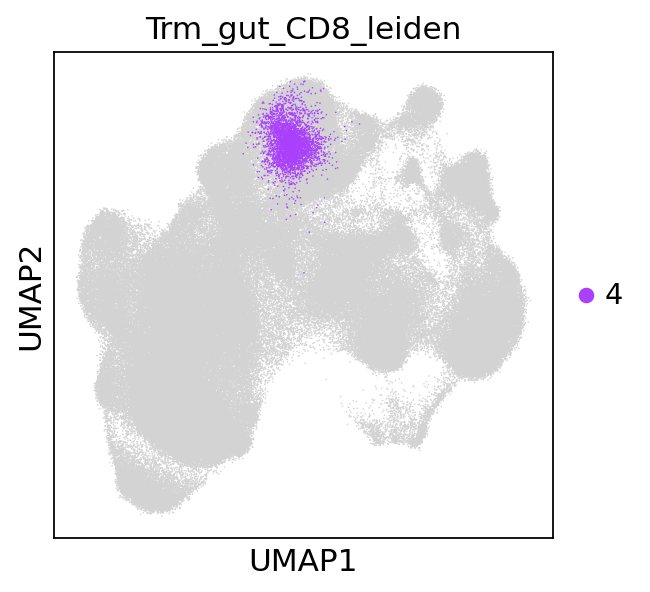

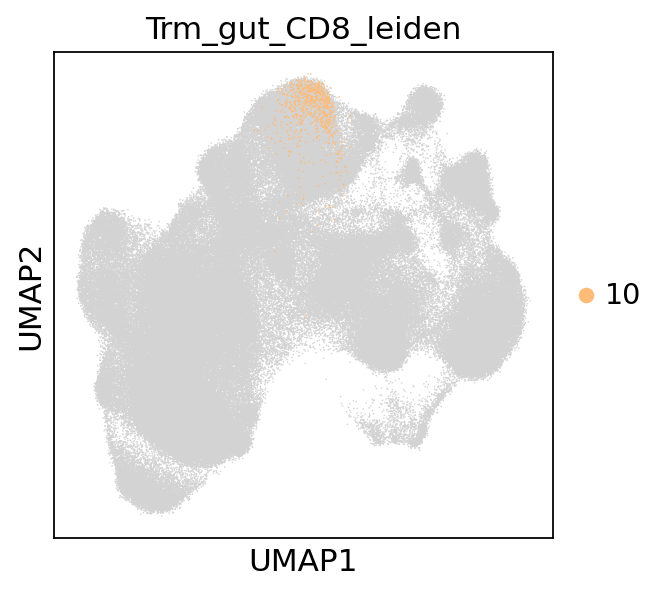

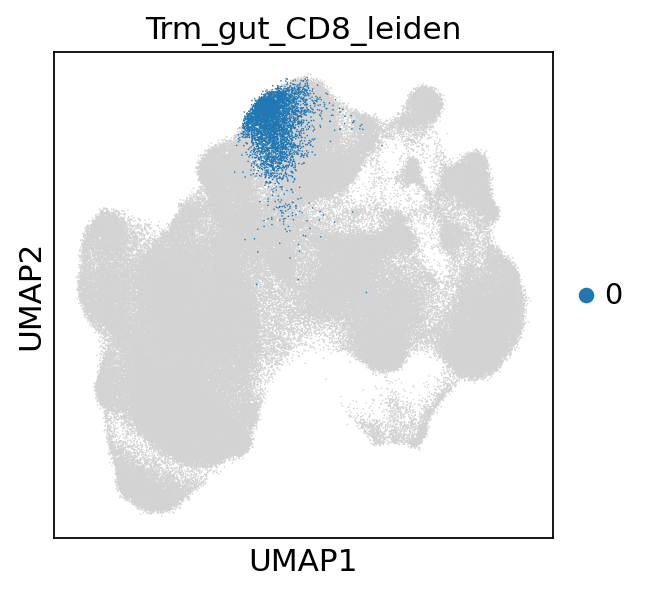

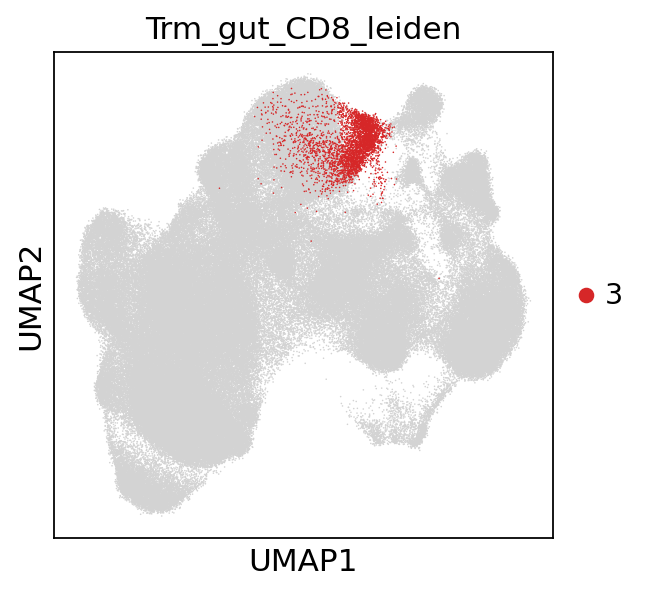

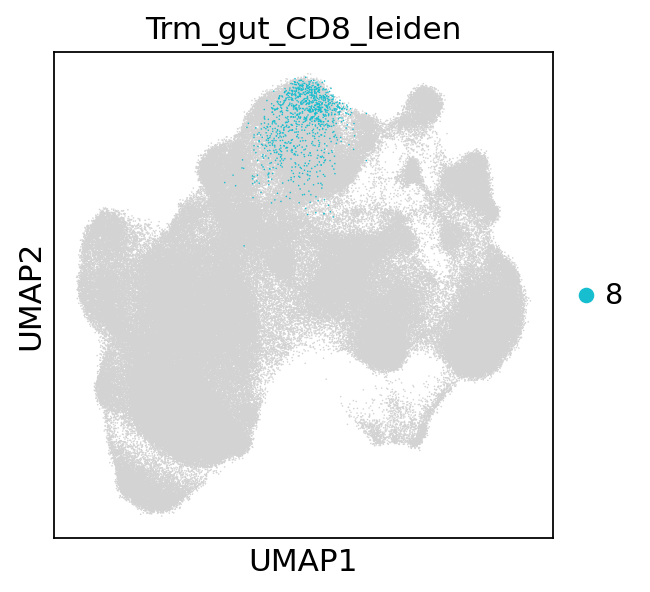

...

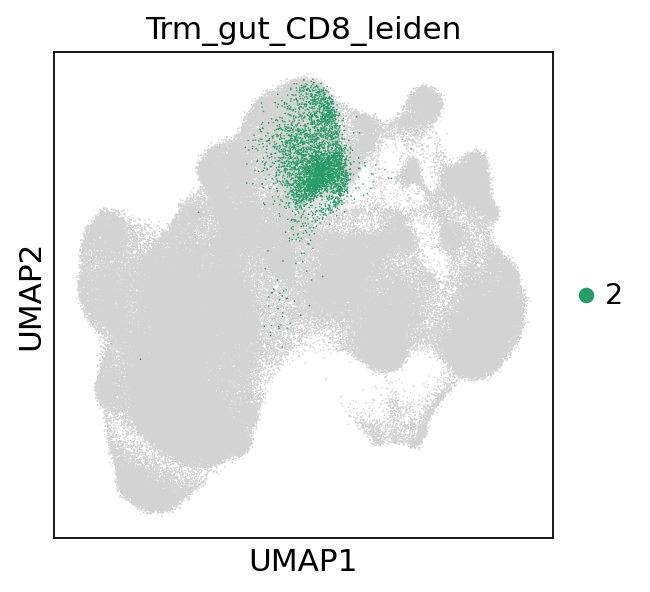

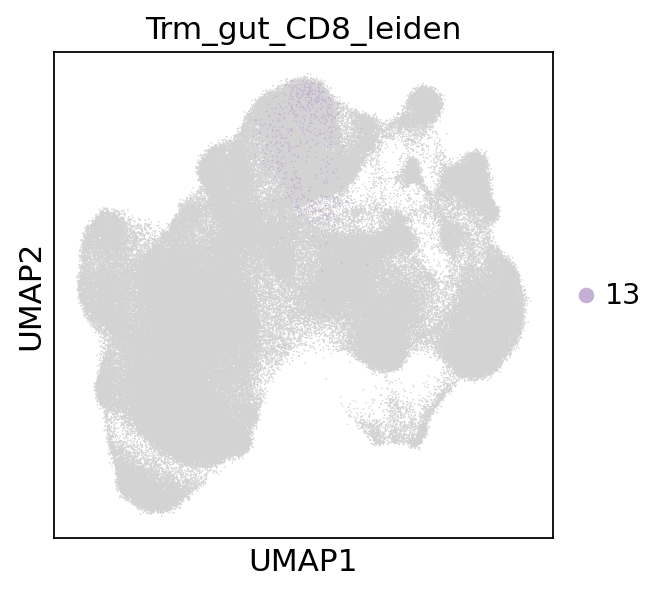

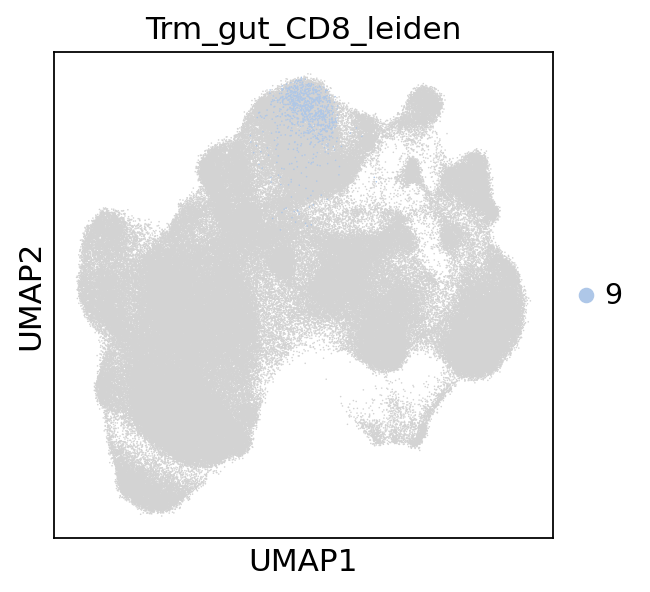

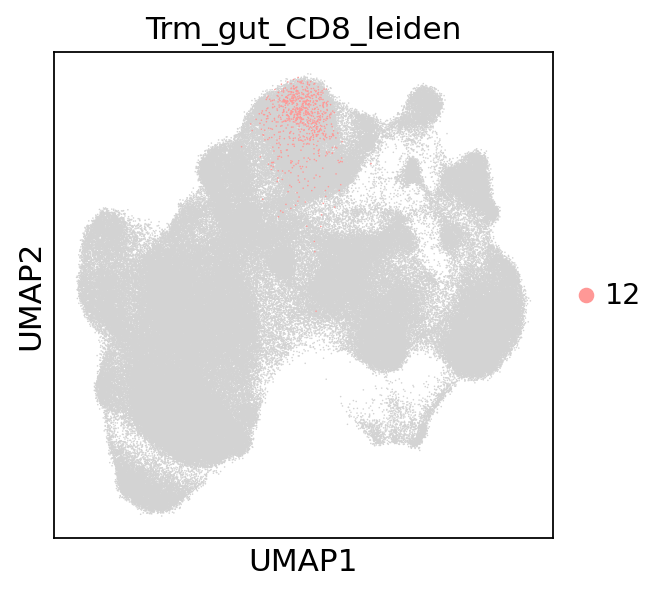

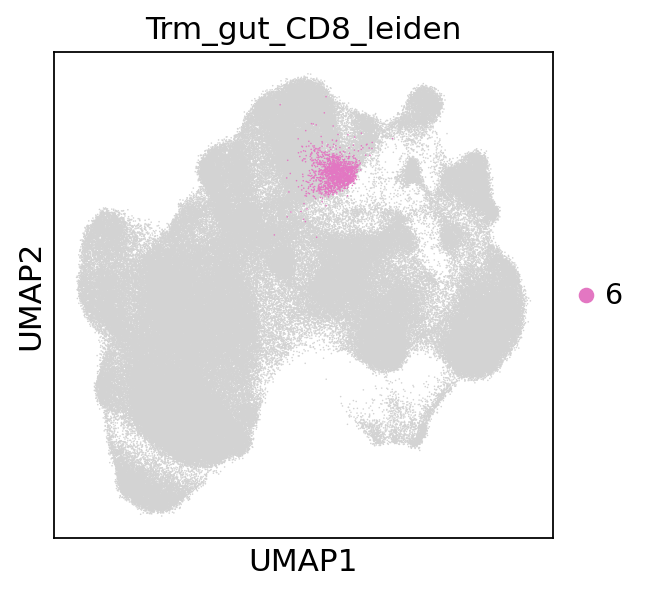

In [86]:
for n in ['4',
 '10',
 '0',
 '3',
 '8',
 '5',
 '14',
 '1',
 '11',
 '7',
 '2',
 '13',
 '9',
 '12',
 '6']:
    sc.pl.umap(tdata, color='Trm_gut_CD8_leiden', groups=n, size=2)

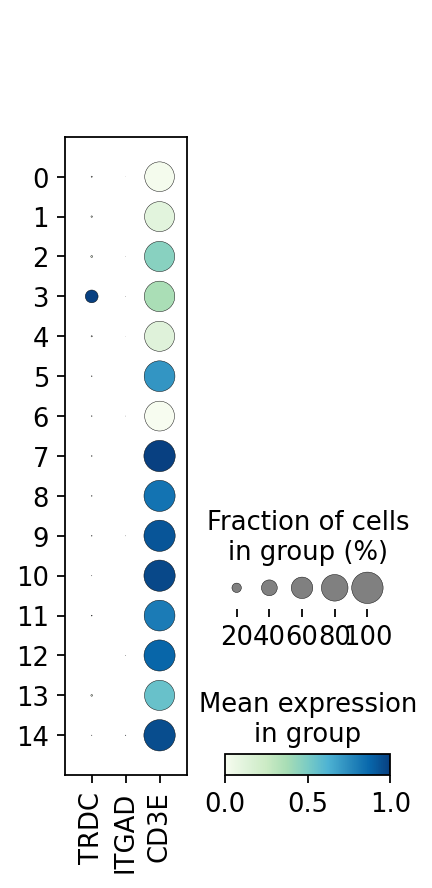

In [87]:
sc.pl.dotplot(tdata, var_names=['TRDC','ITGAD','CD3E'], groupby='Trm_gut_CD8_leiden', standard_scale='var', cmap='GnBu')

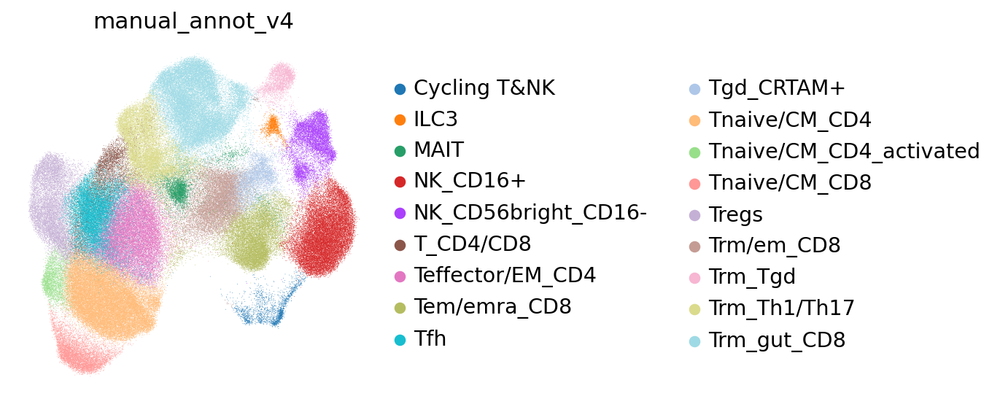

In [88]:
sc.pl.umap(tdata, color='manual_annot_v4', frameon=False)

In [89]:
tdata.obs['manual_annot_v5'] = tdata.obs['manual_annot_v4'].astype(str)

In [90]:
flag = tdata.obs.Trm_gut_CD8_leiden.isin(['3'])

In [91]:
tdata.obs.loc[flag, 'manual_annot_v5'] = tdata.obs.loc[flag, 'Trm_gut_CD8_leiden'].values

... storing 'manual_annot_v5' as categorical


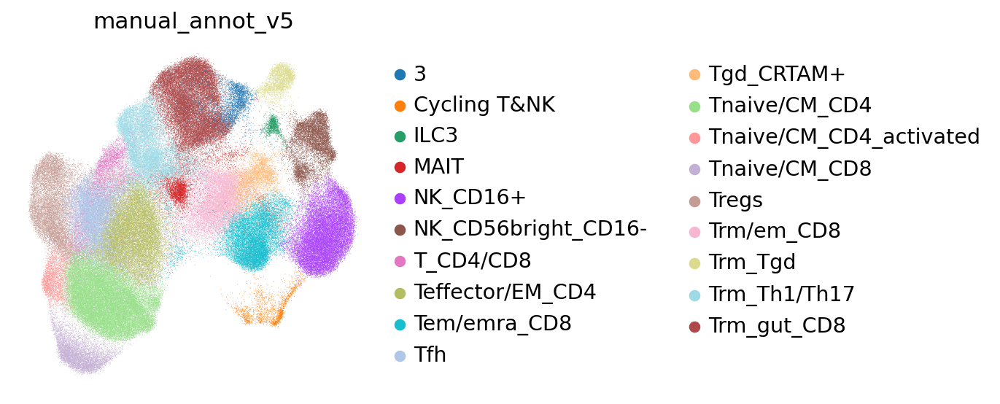

In [92]:
sc.pl.umap(tdata, color='manual_annot_v5', frameon=False)

In [93]:
keys = list(tdata.obs['manual_annot_v5'].unique())

In [94]:
keys

['Trm_Th1/Th17',
 'Trm_gut_CD8',
 'Trm_Tgd',
 'T_CD4/CD8',
 'Trm/em_CD8',
 '3',
 'Cycling T&NK',
 'Tregs',
 'Teffector/EM_CD4',
 'Tem/emra_CD8',
 'Tfh',
 'ILC3',
 'Tnaive/CM_CD4',
 'Tgd_CRTAM+',
 'NK_CD16+',
 'Tnaive/CM_CD8',
 'MAIT',
 'NK_CD56bright_CD16-',
 'Tnaive/CM_CD4_activated']

In [95]:
values = ['Trm_Th1/Th17',
 'Trm_gut_CD8',
 'Trm_Tgd',
 'T_CD4/CD8',
 'Trm/em_CD8',
 'Trm_Tgd',
 'Cycling T&NK',
 'Tregs',
 'Teffector/EM_CD4',
 'Tem/emra_CD8',
 'Tfh',
 'ILC3',
 'Tnaive/CM_CD4',
 'Tgd_CRTAM+',
 'NK_CD16+',
 'Tnaive/CM_CD8',
 'MAIT',
 'NK_CD56bright_CD16-',
 'Tnaive/CM_CD4_activated']

In [96]:
gd_dict = {keys[i]: values[i] for i in range(len(keys))}

In [97]:
tdata.obs['manual_annot_v6'] = tdata.obs['manual_annot_v5'].map(gd_dict)

In [98]:
tdata.obs['manual_annot_v6'].value_counts()

Tnaive/CM_CD4              33865
Trm_gut_CD8                25519
NK_CD16+                   20591
Teffector/EM_CD4           19869
Trm_Th1/Th17               16099
Tfh                        15293
Tem/emra_CD8               14612
Trm/em_CD8                 12674
Tregs                      12143
NK_CD56bright_CD16-         8902
Tnaive/CM_CD8               7801
Trm_Tgd                     6887
T_CD4/CD8                   5631
MAIT                        4849
Tgd_CRTAM+                  4690
Tnaive/CM_CD4_activated     3748
Cycling T&NK                2126
ILC3                        1312
Name: manual_annot_v6, dtype: int64

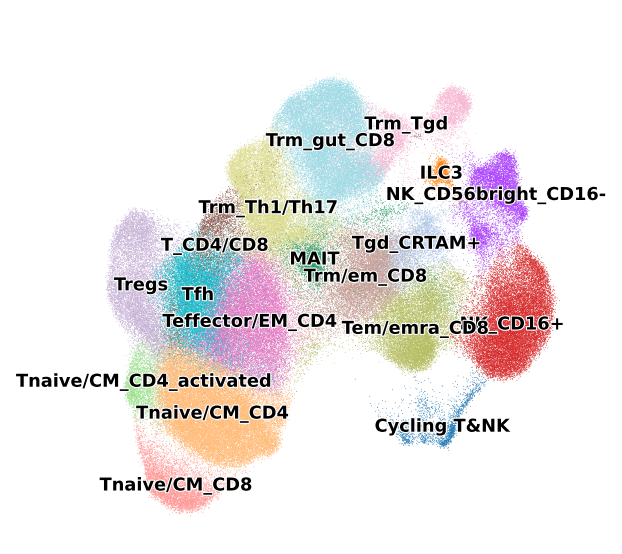

In [102]:
sc.set_figure_params(dpi_save=600)
sc.pl.umap(tdata, color='manual_annot_v6', frameon=False, title=' ', save='4A.pdf',legend_loc='on data', legend_fontoutline=1, legend_fontsize=8)

In [100]:
tdata.write('/mnt/Science_revision/write/TICA_TILC.h5ad')

In [101]:
adata = sc.read('/mnt/Science_revision/write/TICA_TILC.h5ad')

In [21]:
ct_order = ['Tnaive/CM_CD4',
 'Tnaive/CM_CD4_activated','Trm_Th1/Th17',

 'Teffector/EM_CD4',
 'Tfh','Tregs','MAIT', 'T_CD4/CD8','Tnaive/CM_CD8',  'Tem/emra_CD8','Trm/em_CD8',
            'Trm_gut_CD8',
            'Tgd_CRTAM+',
 'Trm_Tgd',
 'Cycling T&NK',
 'NK_CD16+','NK_CD56bright_CD16-',
 
  
 'ILC3']

#### Marker genes

In [26]:
sc.tl.rank_genes_groups(adata, groupby='manual_annot_v6',method='wilcoxon',pts=True)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:18:25)


In [27]:
pts = adata.uns['rank_genes_groups']['pts']
pts_rest = adata.uns['rank_genes_groups']['pts_rest']

result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names

res = pd.DataFrame(index=range(0, pts.shape[0]))
for group in groups:
    df = pd.DataFrame({group + '_' + key: result[key][group] for key in ['names', 'pvals', 'pvals_adj', 'logfoldchanges']})
    df[group+'_pts'] = pts.loc[df[group + '_names'], group].values
    df[group+'_pts_rest'] = pts_rest.loc[df[group + '_names'], group].values
    res = res.join(df)


In [34]:
output = pd.DataFrame()
for group in groups:
       sub_res = res[[f"{group}_{key}" for key in ['names', 'pvals', 'pvals_adj', 'logfoldchanges', 'pts','pts_rest']]]
       sub_res.columns = ['names', 'pvals', 'pvals_adj', 'logfoldchanges', 'pts','pts_rest']
       sub_res['celltype'] = group
       flag = (sub_res['pvals'] < 0.05) & (sub_res['pts'] > 0.5) & (sub_res['pts_rest'] < 0.3)
       sub_res = sub_res[flag]
       output = output.append(sub_res)
output.to_csv('anno_TILC_markers.csv', header=True, index=False)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-

In [30]:
output = pd.DataFrame()
for group in groups:
       sub_res = res[[f"{group}_{key}" for key in ['names', 'pvals', 'pvals_adj', 'logfoldchanges', 'pts','pts_rest']]]
       sub_res.columns = ['names', 'pvals', 'pvals_adj', 'logfoldchanges', 'pts','pts_rest']
       sub_res['celltype'] = group
       flag = (sub_res['pvals'] < 0.05) & (sub_res['pts'] > 0.15) & (sub_res['pts_rest'] < 0.08)
       sub_res = sub_res[flag]
       output = output.append(sub_res)
output.to_csv('anno_TILC_low_exp_markers.csv', header=True, index=False)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-

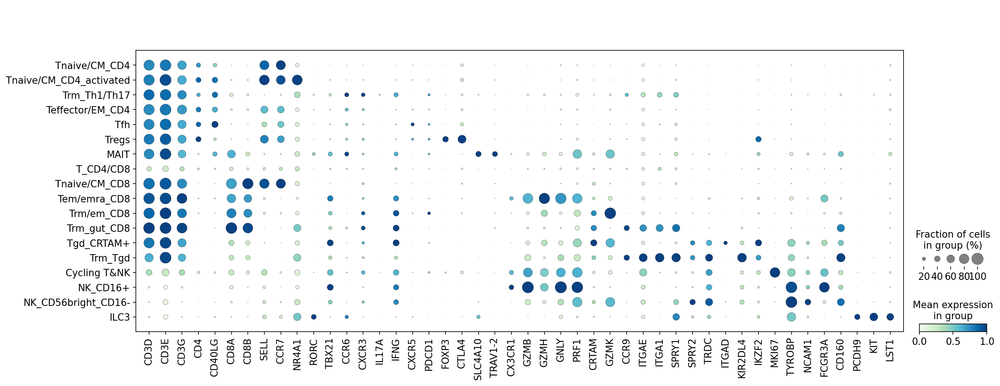

In [48]:
sc.set_figure_params(dpi_save=600)
sc.pl.dotplot(adata, var_names=['CD3D','CD3E','CD3G','CD4','CD40LG','CD8A','CD8B','SELL','CCR7','NR4A1','RORC','TBX21','CCR6','CXCR3','IL17A','IFNG','CXCR5','PDCD1','FOXP3','CTLA4','SLC4A10','TRAV1-2','CX3CR1','GZMB','GZMH','GNLY','PRF1','CRTAM','GZMK','CCR9','ITGAE','ITGA1','SPRY1','SPRY2','TRDC','ITGAD','KIR2DL4','IKZF2','MKI67','TYROBP','NCAM1','FCGR3A','CD160','PCDH9','KIT','LST1'], groupby='manual_annot_v6', standard_scale='var', cmap='GnBu', 
              categories_order=ct_order, save='4B.pdf')                                 